# Understanding our dataset:

In this notebook we would like to use visualization techniques to understand and draw insights from our dataset. 

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import os

In [2]:
df = pd.read_csv('cleaned_diamond.csv')
df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53925,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53926,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53927,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53928,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


In [3]:
num_feat = ['carat', 'depth', 'table', 'price', 'x', 'y', 'z']
cat_feat = ['cut', 'color', 'clarity']

In [4]:
#Let's write a function to visualize the distribution of the numerical features in out dataset
def viz_num_feat(feature_name, bins=30, edgecolor='k', **kwargs):
    fig, ax = plt.subplots(figsize=(9,5))
    df[feature_name].hist(bins=bins, edgecolor=edgecolor, ax=ax, **kwargs)
    ax.set_title(feature_name, size=15)
    plt.figtext(1, 0.15, s=df[feature_name].describe().to_string(), size=16)  
    plt.show()

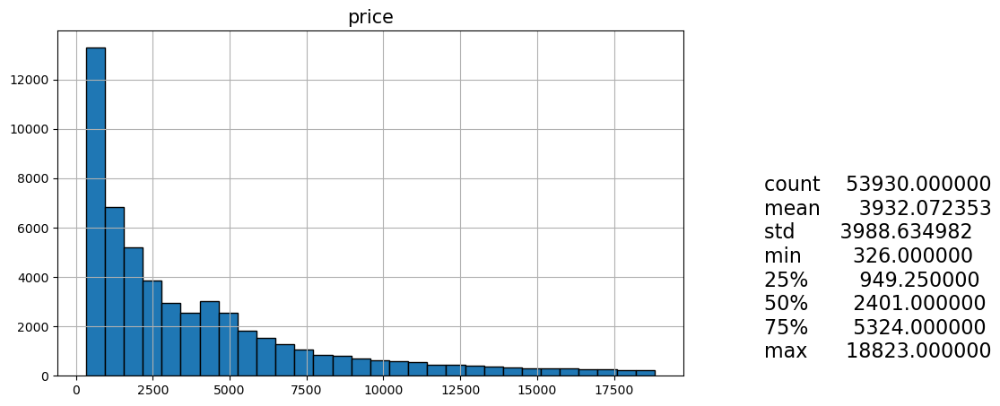

In [5]:
viz_num_feat('price')

**Observations:**

1. As the price of diamond increases, diamond count decreases.

2. The min price of diamond is \\$326 and the max price is $18,823. 

3. Dues to the high variability in price of diamond and the long tail of the distriibution, it is difficult to tell the typical price of a diamond.

4. 25% of diamonds cost below ~$949. 

5. Half of the diamonds cost below $2400.

6. A reasonable price of diamond is expected to be around \\$949 - $5,300.

In [6]:
#def viz_num_feat(feature_name, bins=30, kde=True, color='b', edgecolor='k'):
    
    #fig, ax = plt.subplots(figsize=(9,5))
    #sns.histplot(df[feature_name], bins=30, kde=True, color='b', edgecolor='k')
    
    # Adding labels and title
    #plt.xlabel('Price')
    #plt.ylabel('Frequency')
    #plt.grid(True)
    #plt.title(feature_name, fontweight='bold', fontsize=15)
    #plt.figtext(1,.15,s=df[feature_name].describe().to_string(), size=15)

    # Display the plot
    #plt.show()

In [7]:
#viz_num_feat('price')

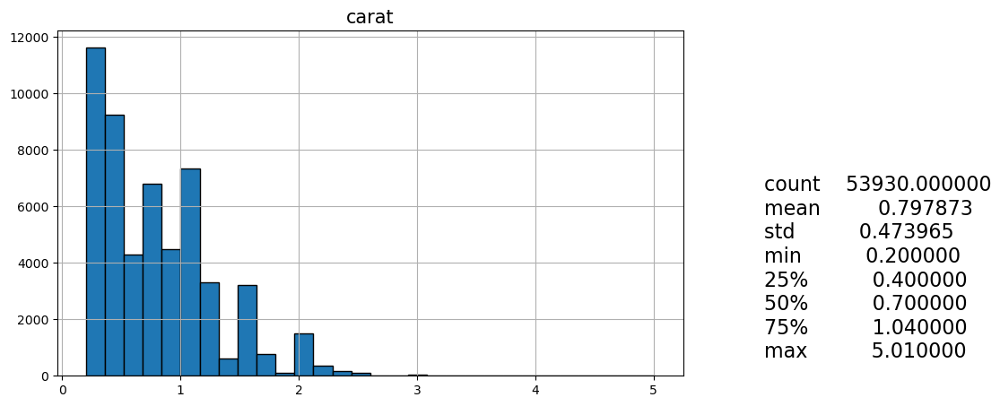

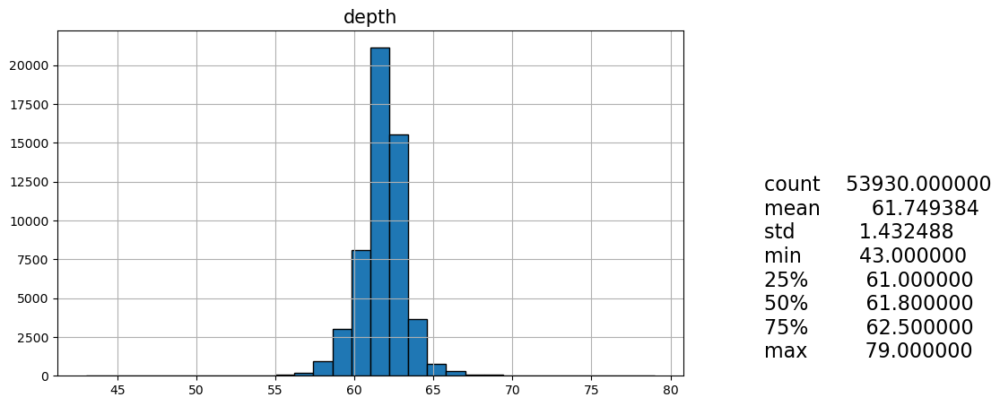

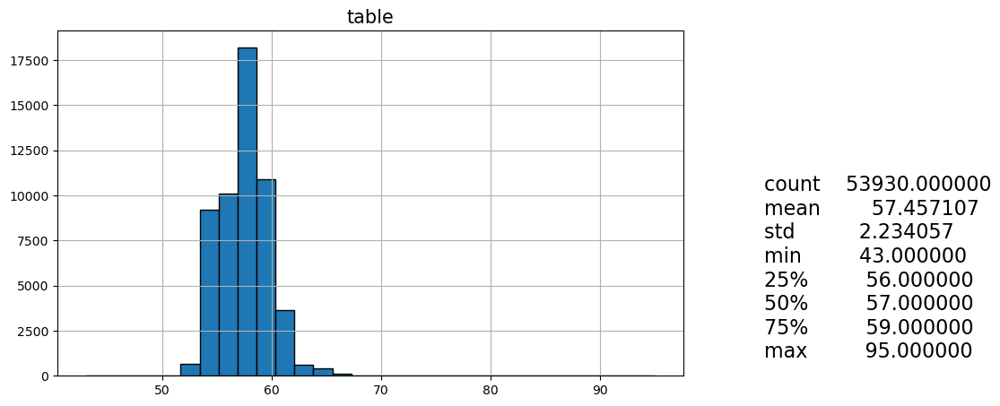

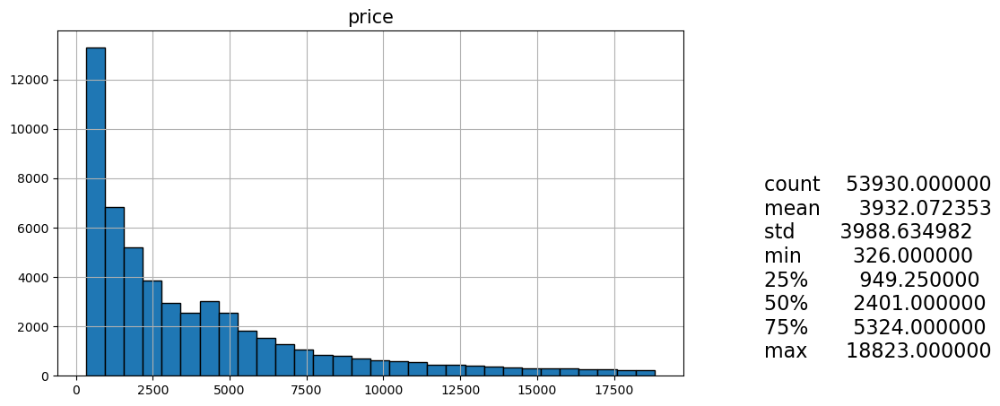

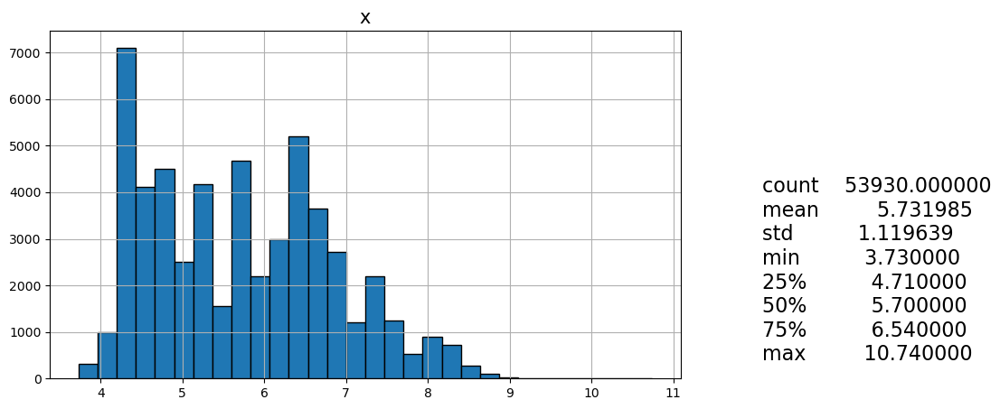

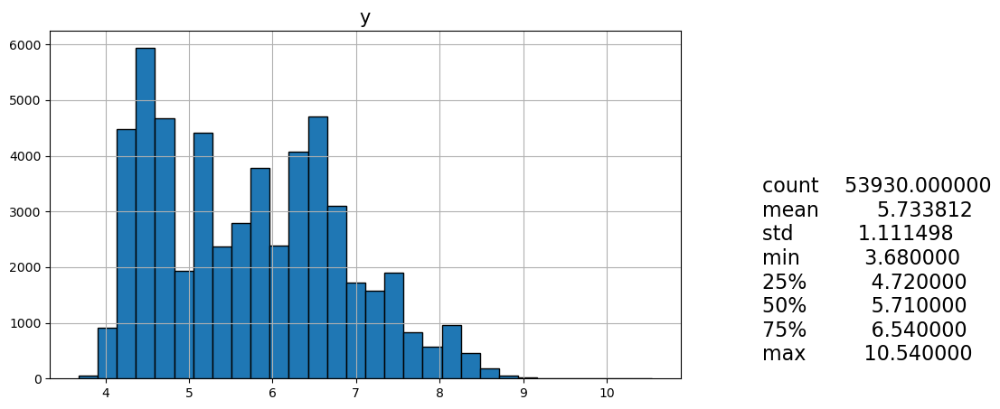

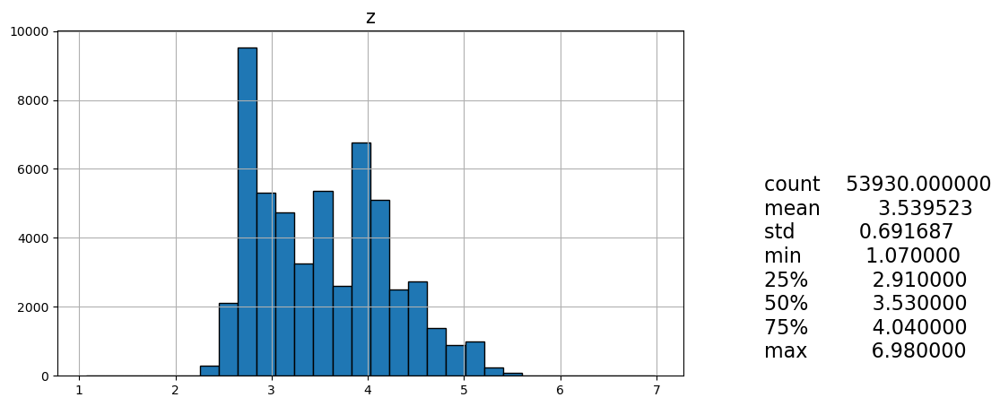

In [8]:
for i in num_feat:
    viz_num_feat(i)

         cut  proportion
0      Ideal       39.96
1    Premium       25.57
2  Very Good       22.40
3       Good        9.09
4       Fair        2.98


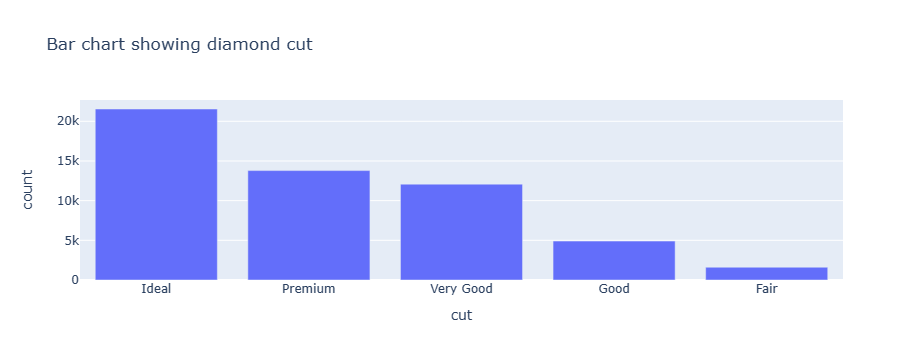

In [9]:
import sys
import plotly.express as px
pct = df[cat_feat[0]].value_counts(normalize=True)*100.
print(pct.round(2).to_frame().reset_index())
cut = df[cat_feat[0]].value_counts(normalize=False).round(2).to_frame().reset_index()
fig = px.bar(cut, 
             x="cut",
             y="count",
             title="Bar chart showing diamond cut")
fig.show()

In [10]:
df[cat_feat[0]].value_counts()

cut
Ideal        21549
Premium      13788
Very Good    12080
Good          4904
Fair          1609
Name: count, dtype: int64

  color  proportion
0     G       20.93
1     E       18.16
2     F       17.69
3     H       15.39
4     D       12.56
5     I       10.05
6     J        5.21


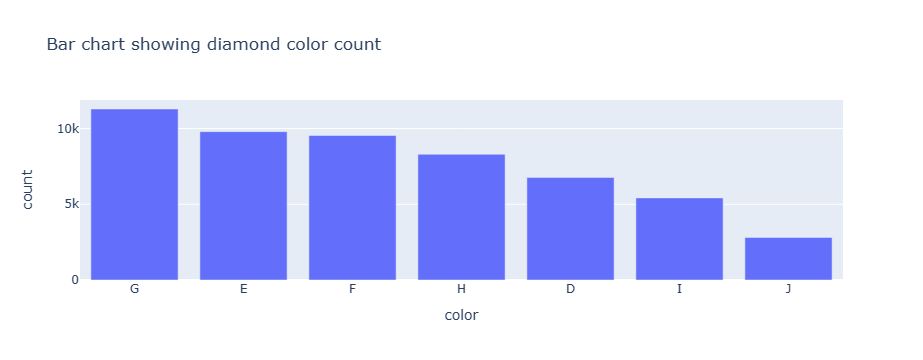

In [11]:
pct = df[cat_feat[1]].value_counts(normalize=True)*100.
print(pct.round(2).to_frame().reset_index())
color = df[cat_feat[1]].value_counts(normalize=False).round(2).to_frame().reset_index()
fig = px.bar(color, 
             x="color",
             y="count",
             title="Bar chart showing diamond color count")
fig.show()

  clarity  proportion
0     SI1       24.23
1     VS2       22.73
2     SI2       17.04
3     VS1       15.15
4    VVS2        9.39
5    VVS1        6.78
6      IF        3.32
7      I1        1.37


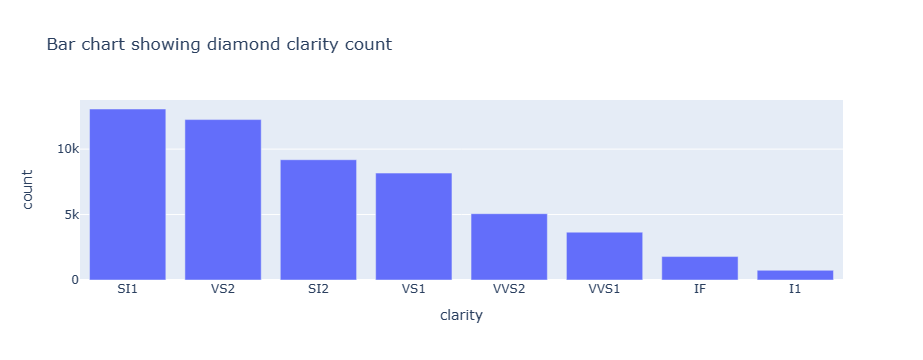

In [12]:
pct = df[cat_feat[2]].value_counts(normalize=True)*100.
print(pct.round(2).to_frame().reset_index())
clarity = df[cat_feat[2]].value_counts(normalize=False).round(2).to_frame().reset_index()
fig = px.bar(clarity, 
             x="clarity",
             y="count",
             title="Bar chart showing diamond clarity count")
fig.show()

## Relationship between numerical features

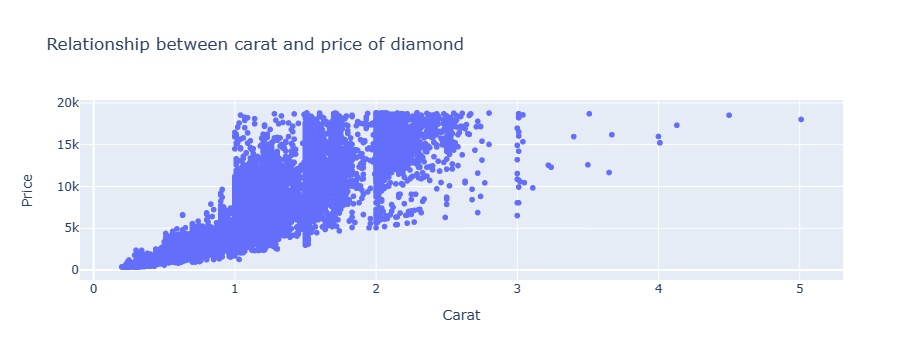

In [13]:
fig = px.scatter(df[num_feat],
                 x=df[num_feat[0]],
                y=df[num_feat[3]],
                 labels={'x':'Carat','y': 'Price'},
                title='Relationship between carat and price of diamond')
fig.show()

**Observations:**

- We notice a nonlinear relationship between diamond carat and thr price of diamond.
- We notice a lot of noise and deviation from the general pattern.
- The price increases and the number of carat increases, hence a positive relationship.

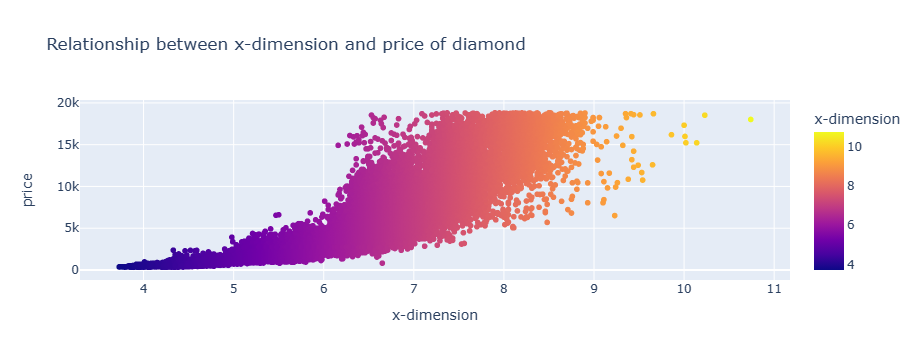

In [16]:
fig = px.scatter(df,
                 x='x',
                y='price',
                 labels={'x':'x-dimension','y': 'Price'},
                 color='x',
                 title='Relationship between x-dimension and price of diamond')
fig.show()

**Observations:**

- As x-dimension increases, the price also increases. Hence, a positive correlation between the two features.
- There are deviations from the general price and x-dimension pattern. 

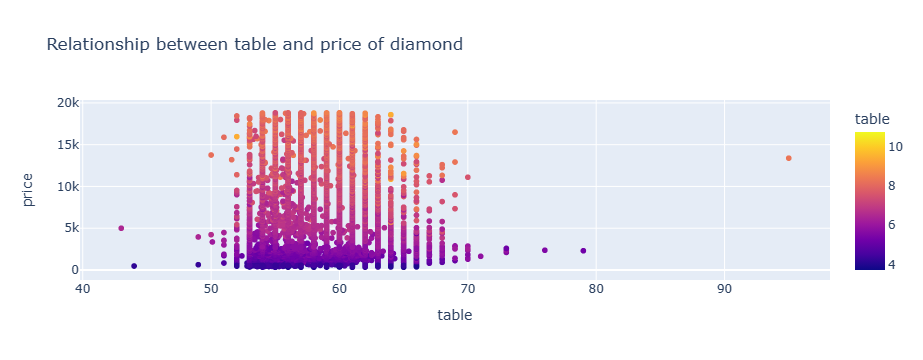

In [18]:
fig = px.scatter(df,
                 x='table',
                y='price',
                 labels={'x':'table','y': 'Price'},
                 color='x',
                 title='Relationship between table and price of diamond')
fig.show()

**Observation:** 
- We find no useful relationship between table and price

C:\Users\nenec\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



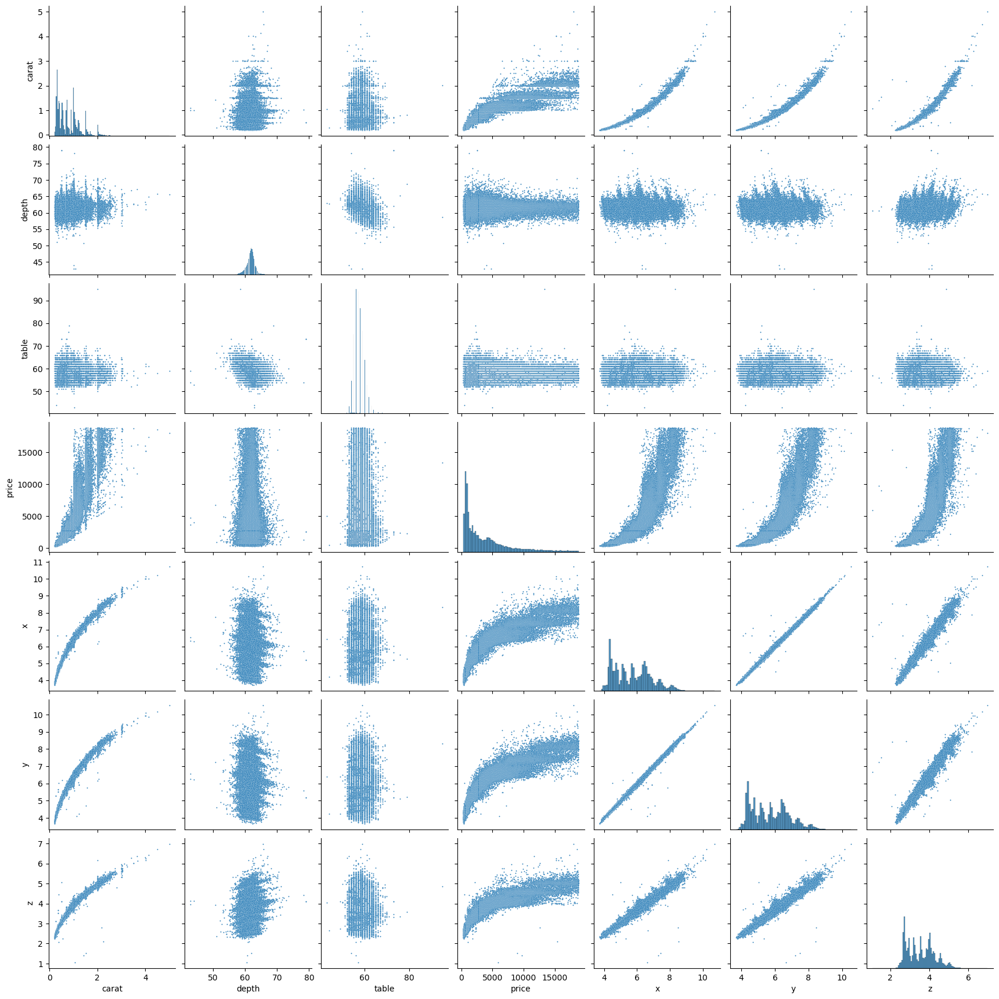

In [14]:
# Lets visualize how all the numerical features compare

sns.pairplot(df[num_feat], plot_kws={"s":2})
plt.show()

In [22]:
# Lets's print the correlation coefficients between the numerical features

df[num_feat].corr().round(4)

,carat,depth,table,price,x,y,z
carat,1.0000,0.0283,0.1817,0.9216,0.9778,0.9768,0.9760
depth,0.0283,1.0000,-0.2957,-0.0106,-0.0250,-0.0282,0.0967
table,0.1817,-0.2957,1.0000,0.1272,0.1961,0.1900,0.1558
price,0.9216,-0.0106,0.1272,1.0000,0.8872,0.8888,0.8817
x,0.9778,-0.0250,0.1961,0.8872,1.0000,0.9987,0.9908
y,0.9768,-0.0282,0.1900,0.8888,0.9987,1.0000,0.9904
z,0.9760,0.0967,0.1558,0.8817,0.9908,0.9904,1.0000


## Understanding diamond carat with diamond dimensions (x, y, z)

C:\Users\nenec\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



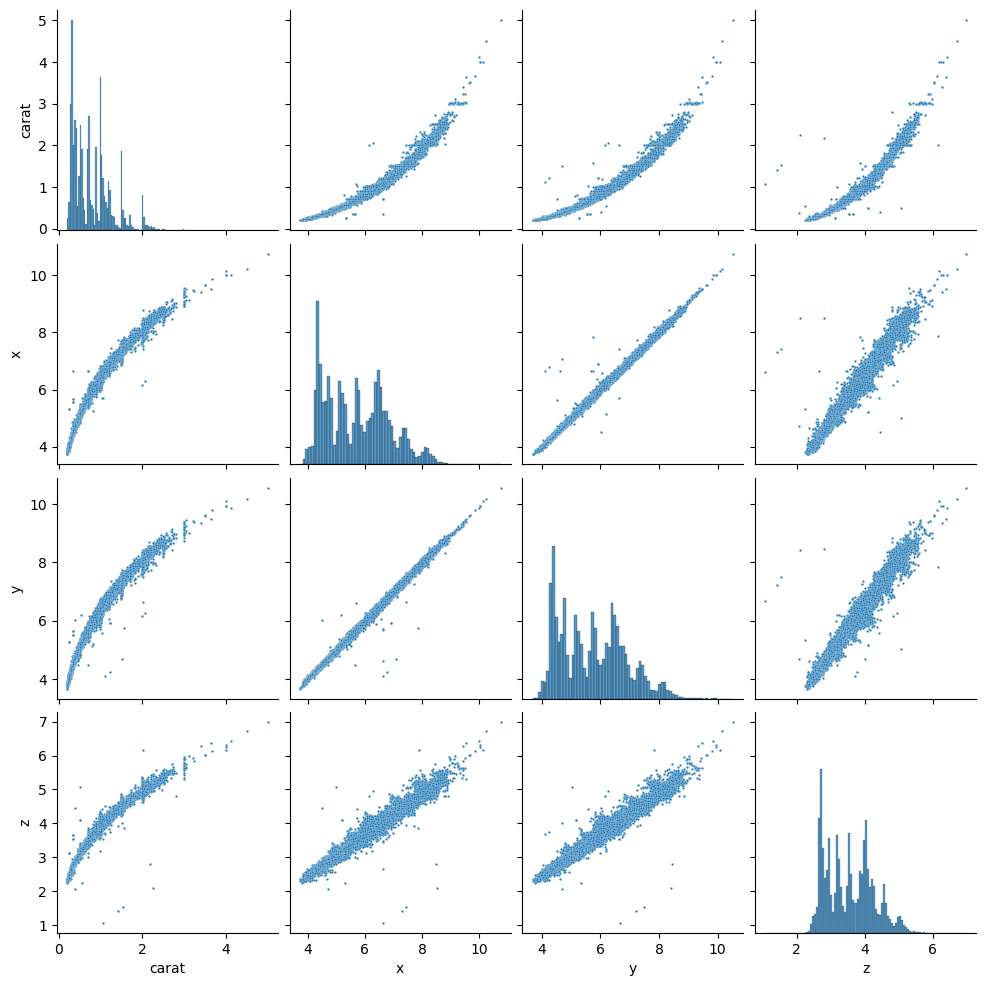

In [24]:
dim_feat = df[['carat', 'x', 'y', 'z']]
sns.pairplot(dim_feat, plot_kws={"s":3})
plt.show()

In [26]:
dim_feat.corr().round(4)

,carat,x,y,z
carat,1.0000,0.9778,0.9768,0.9760
x,0.9778,1.0000,0.9987,0.9908
y,0.9768,0.9987,1.0000,0.9904
z,0.9760,0.9908,0.9904,1.0000


** Observation:**
- Notice a high correlation between x, y, z which looks clearly linear. Basically these three features contain almost the same information. in other words they are not independent.

- Knowing the value of one, to a large extent, tells us about the value of the other.

- In comparison to the carat, the relationship looks quadratic and there is a strong relationship between dimensions and carat. Bigger diamonds are likely to weigh more.

## Cross tables

In [27]:
pd.crosstab(df['cut'], df['color'])

color,D,E,F,G,H,I,J
cut,,,,,,,
Fair,163,224,312,313,303,175,119
Good,662,933,907,871,702,522,307
Ideal,2834,3902,3826,4883,3115,2093,896
Premium,1602,2337,2331,2924,2358,1428,808
Very Good,1513,2399,2164,2299,1823,1204,678


In [38]:
# Let's get the totals for these features.
feat_total = pd.crosstab(df['cut'], df['color'], margins=True, margins_name='Total')
feat_total

color,D,E,F,G,H,I,J,Total
cut,,,,,,,,
Fair,163,224,312,313,303,175,119,1609
Good,662,933,907,871,702,522,307,4904
Ideal,2834,3902,3826,4883,3115,2093,896,21549
Premium,1602,2337,2331,2924,2358,1428,808,13788
Very Good,1513,2399,2164,2299,1823,1204,678,12080
Total,6774,9795,9540,11290,8301,5422,2808,53930


In [39]:
100*feat_total.div(feat_total['Total'], axis=0).round(4)

color,D,E,F,G,H,I,J,Total
cut,,,,,,,,
Fair,10.13,13.92,19.39,19.45,18.83,10.88,7.40,100.0
Good,13.50,19.03,18.50,17.76,14.31,10.64,6.26,100.0
Ideal,13.15,18.11,17.75,22.66,14.46,9.71,4.16,100.0
Premium,11.62,16.95,16.91,21.21,17.10,10.36,5.86,100.0
Very Good,12.52,19.86,17.91,19.03,15.09,9.97,5.61,100.0
Total,12.56,18.16,17.69,20.93,15.39,10.05,5.21,100.0


This tell us how the proportions of diamonds of different colors vary across the different cuts. If the proportions stay roughly the same, then we can infer that there's no relationship between these features.

**Observation:**

- The bottom row indicates that the overall proportion of diamonds of different colors is independent of their cut.

- We observe some normal variations, but we do not see any considerable deviation from the marginal frquency, which again tells us that knowing the cut of a diamond does not give us any information about its color.

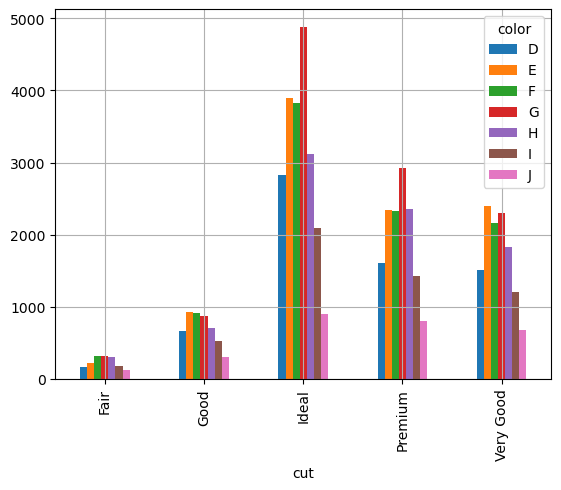

In [40]:
ct = pd.crosstab(df['cut'], df['color'])
ct.plot(kind='bar')
plt.grid(True)
plt.show()

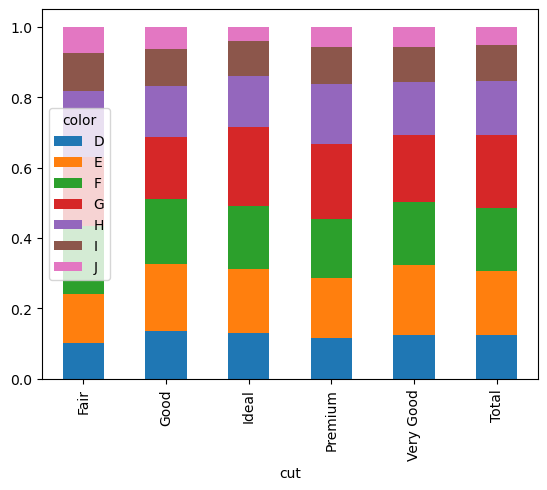

In [43]:
# Let's take a look at the normalized barplot, which is useful for comparing the proportions of colors across cuts,
#Ignoring the number of diamonds in every cut category.

feat_total.div(feat_total['Total'], axis=0).iloc[:,:-1].plot(kind='bar', stacked=True)
plt.show()

We notice that within each category of the cut, the proportion of color types is about the same confirming our previous observation about the relationship between these two features.

## Box Plots.

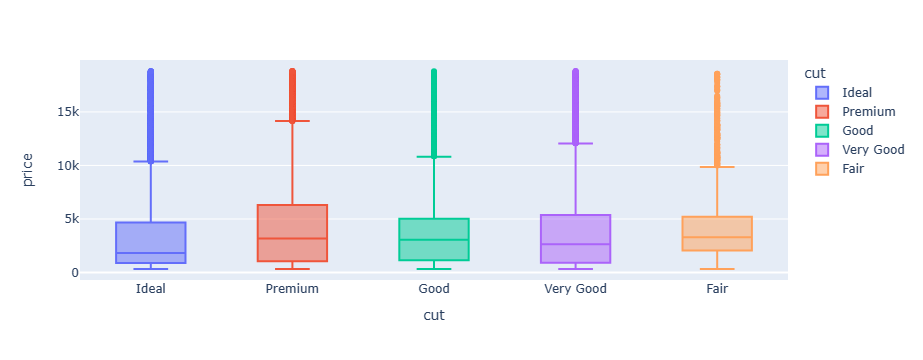

In [48]:
fig = px.box(df, x='cut', y='price', color='cut')
fig.show()

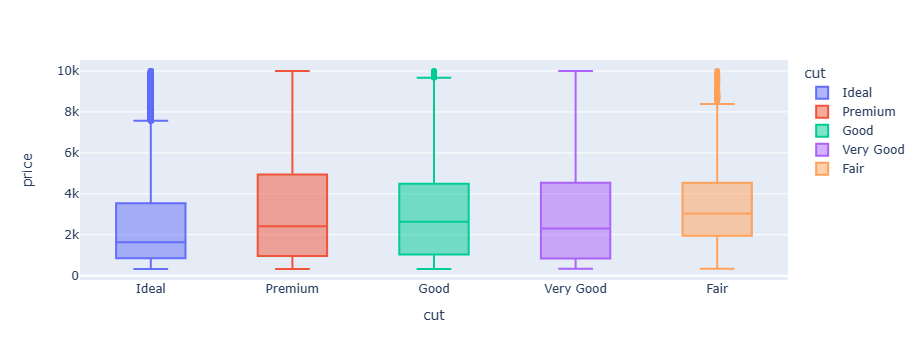

In [51]:
data = df[df['price']<10000]
fig = px.box(data, x='cut', y='price', color='cut')
fig.show()

In [ ]:
**Observations:**
- 